# Hear the Difference — AM vs FM Modulation with Real Voice

This notebook loads a voice recording, modulates it with AM and FM, adds noise, demodulates, and lets you **listen** to the results. You'll hear firsthand why FM dominates land mobile radio.

Place your voice recording (`.m4a`, `.wav`, `.mp3`, etc.) in the same directory as this notebook. Update the `VOICE_FILE` variable in the load cell if your filename differs. Requires `ffmpeg` for non-WAV formats (`brew install ffmpeg`).

---

## 0. Setup

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal as sig
from scipy.io import wavfile
from scipy.signal import hilbert, resample, butter, sosfilt, firwin, lfilter
from scipy.fft import fft
from IPython.display import Audio, display, Markdown

plt.rcParams.update({
    'figure.figsize': (14, 3.5),
    'axes.grid': True,
    'grid.alpha': 0.3,
    'font.size': 11,
    'lines.linewidth': 1.0,
})

def power_spectrum(signal_data, fs, nfft=None):
    """Single-sided power spectrum in dB."""
    if nfft is None:
        nfft = len(signal_data)
    S = fft(signal_data, n=nfft)
    S_mag = np.abs(S[:nfft // 2]) / nfft
    S_db = 20 * np.log10(S_mag + 1e-12)
    freqs = np.linspace(0, fs / 2, nfft // 2)
    return freqs, S_db

def normalize(x):
    """Normalize to [-1, 1]."""
    return x / (np.max(np.abs(x)) + 1e-12)

print('Ready.')

Ready.


---
## 1. Load and Prepare Voice

We load the audio file (converting to WAV via ffmpeg if needed), convert to mono if needed, normalize, and resample to a working rate. We need a sample rate high enough to represent our simulated carrier frequency — we'll use 96 kHz, which lets us put a carrier at 20 kHz with plenty of room.

In [3]:
# Load the voice file (handles .wav, .m4a, .mp3, etc.)
import subprocess, tempfile, os

VOICE_FILE = 'my_voice.m4a'  # ← change this to your filename

def load_audio(filepath):
    """Load any audio format. Uses scipy for wav, ffmpeg for everything else."""
    ext = os.path.splitext(filepath)[1].lower()
    if ext == '.wav':
        rate, data = wavfile.read(filepath)
        return rate, data
    else:
        # Convert to wav via ffmpeg in a temp file
        tmp = tempfile.NamedTemporaryFile(suffix='.wav', delete=False)
        tmp.close()
        subprocess.run([
            'ffmpeg', '-y', '-i', filepath,
            '-ac', '1',        # mono
            '-ar', '44100',    # standard sample rate
            '-sample_fmt', 's16',
            tmp.name
        ], check=True, capture_output=True)
        rate, data = wavfile.read(tmp.name)
        os.unlink(tmp.name)
        return rate, data

raw_rate, raw_data = load_audio(VOICE_FILE)
print(f'Loaded: {raw_rate} Hz, shape={raw_data.shape}, dtype={raw_data.dtype}')

# Convert to mono float64 in [-1, 1]
if raw_data.ndim > 1:
    raw_data = raw_data.mean(axis=1)  # stereo → mono
voice = raw_data.astype(np.float64)
voice = normalize(voice)

# Trim to a manageable length (first 5 seconds max)
max_seconds = 5
max_samples = raw_rate * max_seconds
if len(voice) > max_samples:
    voice = voice[:max_samples]
    print(f'Trimmed to {max_seconds} seconds')

duration = len(voice) / raw_rate
print(f'Duration: {duration:.2f}s, {len(voice)} samples')

# Resample to our working rate
fs_work = 96_000  # 96 kHz working sample rate
num_samples_new = int(len(voice) * fs_work / raw_rate)
voice_96k = resample(voice, num_samples_new)
voice_96k = normalize(voice_96k)
t = np.arange(len(voice_96k)) / fs_work

# Also keep a copy at 44.1 kHz for playback
fs_play = 44100
num_samples_play = int(len(voice) * fs_play / raw_rate)
voice_44k = resample(voice, num_samples_play)
voice_44k = normalize(voice_44k)

print(f'Resampled: {len(voice_96k)} samples at {fs_work} Hz (working)')
print(f'           {len(voice_44k)} samples at {fs_play} Hz (playback)')

Loaded: 44100 Hz, shape=(193688,), dtype=int16
Duration: 4.39s, 193688 samples
Resampled: 421633 samples at 96000 Hz (working)
           193688 samples at 44100 Hz (playback)


### Listen to the original

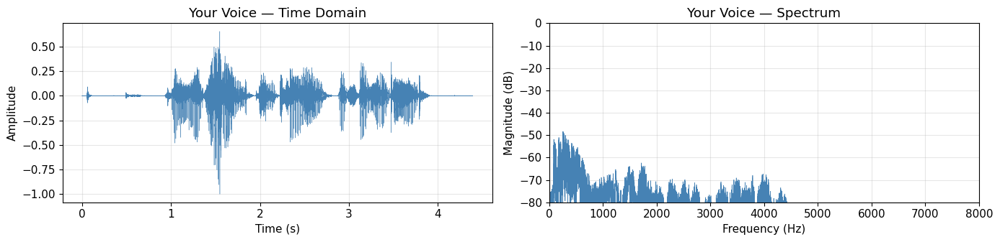

**Original voice:**

In [4]:
# Plot it
fig, axes = plt.subplots(1, 2, figsize=(14, 3.5))
axes[0].plot(t, voice_96k, linewidth=0.3, color='steelblue')
axes[0].set_xlabel('Time (s)')
axes[0].set_ylabel('Amplitude')
axes[0].set_title('Your Voice — Time Domain')

freqs_v, psd_v = power_spectrum(voice_96k, fs_work)
axes[1].plot(freqs_v, psd_v, linewidth=0.5, color='steelblue')
axes[1].set_xlim(0, 8000)
axes[1].set_ylim(-80, 0)
axes[1].set_xlabel('Frequency (Hz)')
axes[1].set_ylabel('Magnitude (dB)')
axes[1].set_title('Your Voice — Spectrum')
plt.tight_layout()
plt.show()

display(Markdown('**Original voice:**'))
display(Audio(voice_44k, rate=fs_play))

---
## 2. Band-Limit the Voice (Radio Audio Filter)

Real radios bandpass the audio to roughly 300–3000 Hz before modulation. This is why FM radio voice sounds "narrow" compared to a phone call. Let's apply that filter so everything downstream is realistic — and so you can hear what it does to your voice.

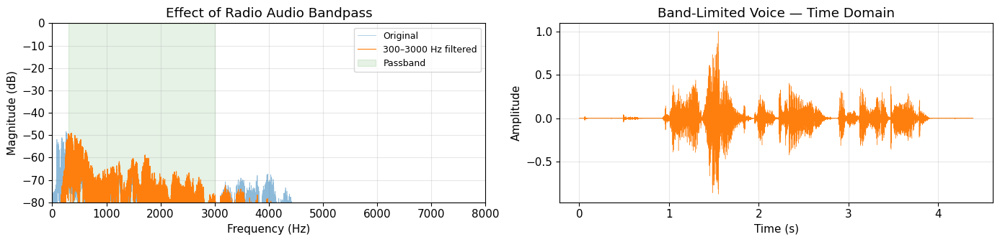

**Band-limited voice (this is what goes into the modulator):**

In [7]:
# Bandpass filter: 300 Hz – 3000 Hz (voice band for land mobile radio)
sos_voice_bp = butter(5, [300, 3000], btype='band', fs=fs_work, output='sos')
voice_filtered = sosfilt(sos_voice_bp, voice_96k)
voice_filtered = normalize(voice_filtered)

# Downsample filtered version for playback
voice_filt_play = resample(voice_filtered, num_samples_play)
voice_filt_play = normalize(voice_filt_play)

fig, axes = plt.subplots(1, 2, figsize=(14, 3.5))
freqs_o, psd_o = power_spectrum(voice_96k, fs_work)
freqs_f, psd_f = power_spectrum(voice_filtered, fs_work)
axes[0].plot(freqs_o, psd_o, alpha=0.5, label='Original', linewidth=0.5)
axes[0].plot(freqs_f, psd_f, label='300–3000 Hz filtered', linewidth=0.8)
axes[0].set_xlim(0, 8000)
axes[0].set_ylim(-80, 0)
axes[0].set_xlabel('Frequency (Hz)')
axes[0].set_ylabel('Magnitude (dB)')
axes[0].set_title('Effect of Radio Audio Bandpass')
axes[0].axvspan(300, 3000, alpha=0.1, color='green', label='Passband')
axes[0].legend(fontsize=9)

axes[1].plot(t, voice_filtered, linewidth=0.3, color='tab:orange')
axes[1].set_xlabel('Time (s)')
axes[1].set_ylabel('Amplitude')
axes[1].set_title('Band-Limited Voice — Time Domain')
plt.tight_layout()
plt.show()

display(Markdown('**Band-limited voice (this is what goes into the modulator):**'))
display(Audio(voice_filt_play, rate=fs_play))

You should hear the difference — the filtered version sounds thinner, like a radio. The low rumble and high-frequency sibilance are gone. This is what your Baofeng's audio chain does before modulation.

---

## 3. AM Modulation and Demodulation

We'll modulate the voice onto a carrier, then demodulate it with an envelope detector. First with no noise, then with noise added.

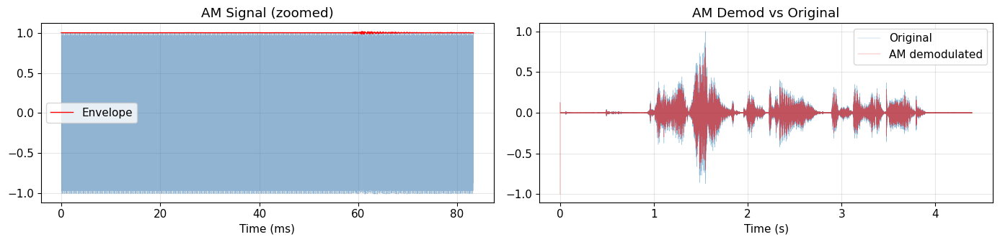

**AM demodulated (clean, no noise):**

In [8]:
# AM parameters
f_carrier = 20_000  # 20 kHz carrier
m_am = 0.8          # modulation index

# Modulate
carrier = np.cos(2 * np.pi * f_carrier * t)
am_signal = (1 + m_am * voice_filtered) * carrier

# --- AM Demodulation (envelope detection) ---
def am_demodulate(rx_signal, fs, f_carrier, audio_cutoff=3500):
    """Envelope detector: rectify + lowpass filter."""
    # Full-wave rectification (absolute value)
    rectified = np.abs(rx_signal)
    # Lowpass filter to extract envelope
    sos_lp = butter(5, audio_cutoff, btype='low', fs=fs, output='sos')
    envelope = sosfilt(sos_lp, rectified)
    # Remove DC offset (the carrier component)
    envelope = envelope - np.mean(envelope)
    return normalize(envelope)

# Demodulate clean AM
am_demod_clean = am_demodulate(am_signal, fs_work, f_carrier)

# Resample for playback
am_clean_play = resample(am_demod_clean, num_samples_play)
am_clean_play = normalize(am_clean_play)

fig, axes = plt.subplots(1, 2, figsize=(14, 3.5))
# Show a short window of the AM waveform with envelope
win = slice(0, 8000)
axes[0].plot(t[win]*1000, am_signal[win], alpha=0.6, linewidth=0.5, color='steelblue')
axes[0].plot(t[win]*1000, 1 + m_am * voice_filtered[win], 'r-', linewidth=1, label='Envelope')
axes[0].set_xlabel('Time (ms)')
axes[0].set_title('AM Signal (zoomed)')
axes[0].legend()

axes[1].plot(t, voice_filtered, alpha=0.5, linewidth=0.3, label='Original')
axes[1].plot(t, am_demod_clean, alpha=0.7, linewidth=0.3, label='AM demodulated', color='tab:red')
axes[1].set_xlabel('Time (s)')
axes[1].set_title('AM Demod vs Original')
axes[1].legend()
plt.tight_layout()
plt.show()

display(Markdown('**AM demodulated (clean, no noise):**'))
display(Audio(am_clean_play, rate=fs_play))

---
## 4. FM Modulation and Demodulation

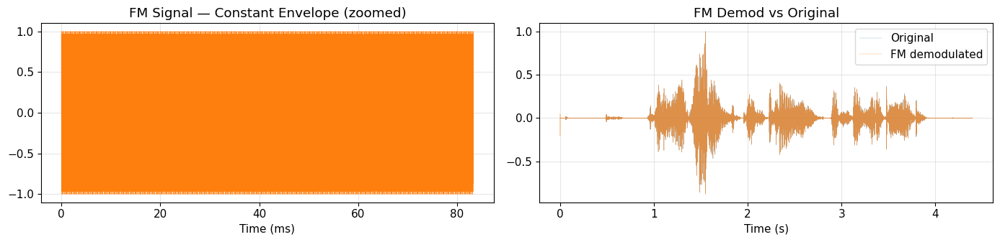

**FM demodulated (clean, no noise):**

In [9]:
# FM parameters
freq_dev = 2500  # ±2.5 kHz deviation (GMRS narrowband)

# Modulate: integrate message, apply to carrier phase
phase_integral = np.cumsum(voice_filtered) / fs_work
fm_signal = np.cos(2 * np.pi * f_carrier * t + 2 * np.pi * freq_dev * phase_integral)

# --- FM Demodulation (arctan discriminator) ---
def fm_demodulate(rx_signal, fs, audio_cutoff=3500):
    """Demodulate FM using the analytic signal method."""
    # Get analytic signal via Hilbert transform
    analytic = hilbert(rx_signal)
    # Instantaneous phase
    inst_phase = np.unwrap(np.angle(analytic))
    # Differentiate phase → instantaneous frequency → audio
    demod = np.diff(inst_phase) * fs / (2 * np.pi)
    demod = np.append(demod, demod[-1])  # pad to match length
    # Remove carrier frequency offset
    demod = demod - np.mean(demod)
    # Lowpass to clean up
    sos_lp = butter(5, audio_cutoff, btype='low', fs=fs, output='sos')
    demod = sosfilt(sos_lp, demod)
    return normalize(demod)

# Demodulate clean FM
fm_demod_clean = fm_demodulate(fm_signal, fs_work)

# Resample for playback
fm_clean_play = resample(fm_demod_clean, num_samples_play)
fm_clean_play = normalize(fm_clean_play)

fig, axes = plt.subplots(1, 2, figsize=(14, 3.5))
win = slice(0, 8000)
axes[0].plot(t[win]*1000, fm_signal[win], linewidth=0.5, color='tab:orange')
axes[0].set_xlabel('Time (ms)')
axes[0].set_title('FM Signal — Constant Envelope (zoomed)')

axes[1].plot(t, voice_filtered, alpha=0.5, linewidth=0.3, label='Original')
axes[1].plot(t, fm_demod_clean, alpha=0.7, linewidth=0.3, label='FM demodulated', color='tab:orange')
axes[1].set_xlabel('Time (s)')
axes[1].set_title('FM Demod vs Original')
axes[1].legend()
plt.tight_layout()
plt.show()

display(Markdown('**FM demodulated (clean, no noise):**'))
display(Audio(fm_clean_play, rate=fs_play))

Both should sound basically identical to the band-limited original at this point. The real difference shows up when we add noise.

---

## 5. The Main Event — Adding Noise

This is the payoff. We'll add the **exact same noise** to both the AM and FM signals before demodulating, simulating what happens to a signal traveling through a noisy RF environment. The SNR (signal-to-noise ratio) parameter controls how much noise — lower values mean more noise.

**Try different SNR values** to hear the degradation curve for each modulation type.

In [13]:
def add_awgn(signal_data, snr_db):
    """Add white Gaussian noise at a specified SNR (in dB)."""
    sig_power = np.mean(signal_data ** 2)
    noise_power = sig_power / (10 ** (snr_db / 10))
    noise = np.sqrt(noise_power) * np.random.randn(len(signal_data))
    return signal_data + noise, noise

# ============================================
# CHANGE THIS VALUE AND RE-RUN THE CELL
# Try: 30 (clean), 20 (mild), 10 (noisy), 5 (harsh), 0 (brutal)
# ============================================
SNR_DB = 30

np.random.seed(42)  # reproducible noise

# Add noise to AM
am_noisy, noise = add_awgn(am_signal, SNR_DB)
am_demod_noisy = am_demodulate(am_noisy, fs_work, f_carrier)
am_noisy_play = normalize(resample(am_demod_noisy, num_samples_play))

# Add the SAME noise realization to FM (reset seed)
np.random.seed(42)
fm_noisy, _ = add_awgn(fm_signal, SNR_DB)
fm_demod_noisy = fm_demodulate(fm_noisy, fs_work)
fm_noisy_play = normalize(resample(fm_demod_noisy, num_samples_play))

print(f'SNR = {SNR_DB} dB')
print(f'(Lower = more noise. Try 30, 20, 10, 5, 0)')

SNR = 30 dB
(Lower = more noise. Try 30, 20, 10, 5, 0)


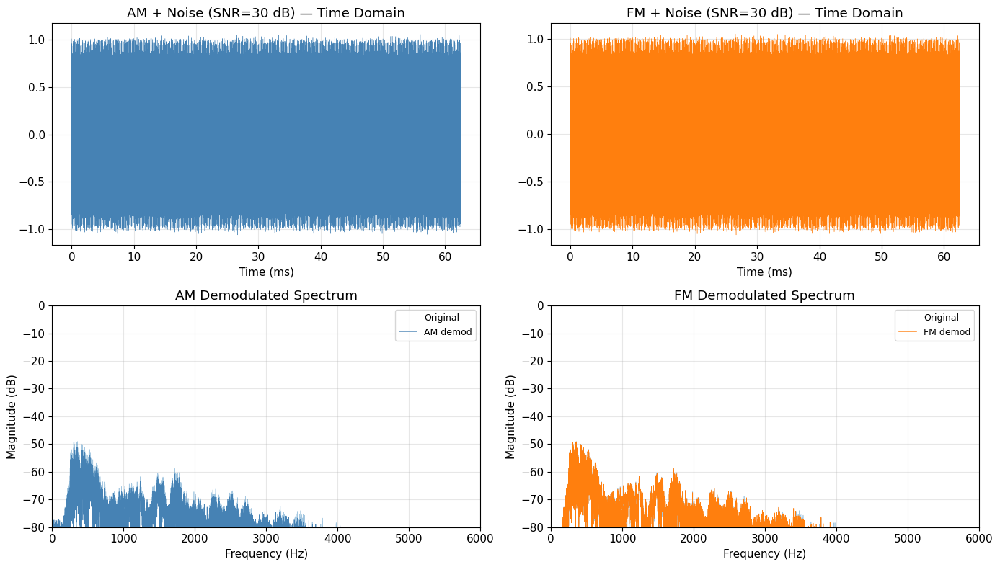

In [14]:
# Visualize the noisy signals and their demodulated spectra
fig, axes = plt.subplots(2, 2, figsize=(14, 8))

win = slice(0, 6000)

# Noisy AM waveform
axes[0, 0].plot(t[win]*1000, am_noisy[win], linewidth=0.3, color='steelblue')
axes[0, 0].set_title(f'AM + Noise (SNR={SNR_DB} dB) — Time Domain')
axes[0, 0].set_xlabel('Time (ms)')

# Noisy FM waveform
axes[0, 1].plot(t[win]*1000, fm_noisy[win], linewidth=0.3, color='tab:orange')
axes[0, 1].set_title(f'FM + Noise (SNR={SNR_DB} dB) — Time Domain')
axes[0, 1].set_xlabel('Time (ms)')

# Demodulated AM spectrum
f_am, p_am = power_spectrum(am_demod_noisy, fs_work)
f_orig, p_orig = power_spectrum(voice_filtered, fs_work)
axes[1, 0].plot(f_orig, p_orig, alpha=0.4, linewidth=0.5, label='Original')
axes[1, 0].plot(f_am, p_am, linewidth=0.5, label='AM demod', color='steelblue')
axes[1, 0].set_xlim(0, 6000)
axes[1, 0].set_ylim(-80, 0)
axes[1, 0].set_xlabel('Frequency (Hz)')
axes[1, 0].set_ylabel('Magnitude (dB)')
axes[1, 0].set_title('AM Demodulated Spectrum')
axes[1, 0].legend(fontsize=9)

# Demodulated FM spectrum
f_fm, p_fm = power_spectrum(fm_demod_noisy, fs_work)
axes[1, 1].plot(f_orig, p_orig, alpha=0.4, linewidth=0.5, label='Original')
axes[1, 1].plot(f_fm, p_fm, linewidth=0.5, label='FM demod', color='tab:orange')
axes[1, 1].set_xlim(0, 6000)
axes[1, 1].set_ylim(-80, 0)
axes[1, 1].set_xlabel('Frequency (Hz)')
axes[1, 1].set_ylabel('Magnitude (dB)')
axes[1, 1].set_title('FM Demodulated Spectrum')
axes[1, 1].legend(fontsize=9)

plt.tight_layout()
plt.show()

### Listen to both — same noise, different modulation

In [15]:
display(Markdown(f'### SNR = {SNR_DB} dB'))
display(Markdown('**AM with noise:**'))
display(Audio(am_noisy_play, rate=fs_play))
display(Markdown('**FM with noise:**'))
display(Audio(fm_noisy_play, rate=fs_play))
display(Markdown('**Original (for reference):**'))
display(Audio(voice_filt_play, rate=fs_play))

### SNR = 30 dB

**AM with noise:**

**FM with noise:**

**Original (for reference):**

### What to listen for

At **SNR = 30 dB**: Both sound fine. Hard to tell the difference.

At **SNR = 20 dB**: AM starts to get a hiss underneath the voice. FM still sounds clean.

At **SNR = 10 dB**: AM is noticeably noisy — the voice is there but buried in static. FM is holding up much better. This is the FM advantage in action.

At **SNR = 5 dB**: AM is barely intelligible. FM is degraded but you can still make out words.

At **SNR = 0 dB** (signal power equals noise power): AM is gone. FM is struggling but may still have recognizable fragments.

**Why?** AM carries information in amplitude — noise IS amplitude disturbance, so it directly corrupts the signal. FM carries information in frequency — amplitude noise doesn't change the frequency, so a limiter (which we simulate implicitly via the phase-based demodulator) strips most of it off.

---

## 6. Impulse Noise — Lightning, Ignition, Power Lines

White Gaussian noise is the textbook case, but in the real world — especially on GMRS — you encounter **impulse noise**: sharp spikes from lightning, spark plugs, electric fences, brushed motors. These are amplitude events, which means FM should handle them even better relative to AM.

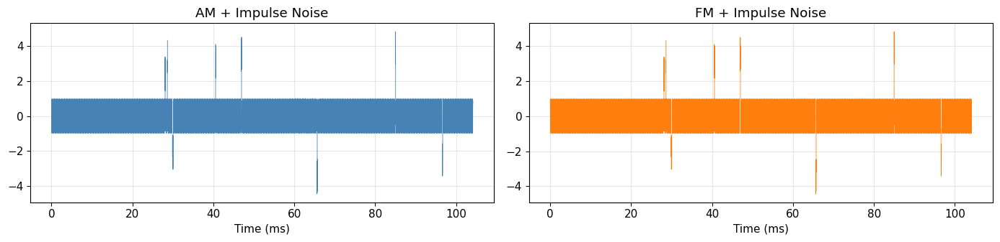

**AM with impulse noise:**

**FM with impulse noise:**

**Original:**

In [16]:
def add_impulse_noise(signal_data, rate=50, amplitude=5.0, seed=42):
    """Add random impulse spikes to simulate ignition/lightning noise."""
    rng = np.random.RandomState(seed)
    noise = np.zeros_like(signal_data)
    # Random spike locations (Poisson-like: `rate` spikes per second)
    num_spikes = int(rate * len(signal_data) / fs_work)
    spike_locs = rng.randint(0, len(signal_data), num_spikes)
    # Each spike is a short burst (handful of samples)
    for loc in spike_locs:
        width = rng.randint(3, 20)
        end = min(loc + width, len(signal_data))
        polarity = rng.choice([-1, 1])
        noise[loc:end] = polarity * amplitude * rng.uniform(0.5, 1.0)
    return signal_data + noise, noise

# Add impulse noise to both
am_impulse, imp_noise = add_impulse_noise(am_signal, rate=80, amplitude=4.0)
fm_impulse, _ = add_impulse_noise(fm_signal, rate=80, amplitude=4.0)

# Demodulate
am_demod_imp = am_demodulate(am_impulse, fs_work, f_carrier)
fm_demod_imp = fm_demodulate(fm_impulse, fs_work)

am_imp_play = normalize(resample(am_demod_imp, num_samples_play))
fm_imp_play = normalize(resample(fm_demod_imp, num_samples_play))

fig, axes = plt.subplots(1, 2, figsize=(14, 3.5))
win = slice(0, 10000)
axes[0].plot(t[win]*1000, am_impulse[win], linewidth=0.3, color='steelblue')
axes[0].set_title('AM + Impulse Noise')
axes[0].set_xlabel('Time (ms)')
axes[1].plot(t[win]*1000, fm_impulse[win], linewidth=0.3, color='tab:orange')
axes[1].set_title('FM + Impulse Noise')
axes[1].set_xlabel('Time (ms)')
plt.tight_layout()
plt.show()

display(Markdown('**AM with impulse noise:**'))
display(Audio(am_imp_play, rate=fs_play))
display(Markdown('**FM with impulse noise:**'))
display(Audio(fm_imp_play, rate=fs_play))
display(Markdown('**Original:**'))
display(Audio(voice_filt_play, rate=fs_play))

AM should have loud, harsh pops and clicks from the impulse spikes — they pass straight through the envelope detector. FM should be dramatically cleaner because the impulses affect amplitude, not frequency.

---

## 7. FM Deviation Comparison

Your Baofeng can operate in narrow (±2.5 kHz) or wide (±5 kHz) deviation mode. Wider deviation gives better audio quality (more SNR headroom via the FM improvement factor) but uses more spectrum. Let's hear the difference.

In [17]:
deviations = {
    '±1.0 kHz (ultra-narrow)': 1000,
    '±2.5 kHz (GMRS narrow)': 2500,
    '±5.0 kHz (GMRS wide)': 5000,
}

SNR_COMPARE = 12  # moderate noise to hear the difference

for label, dev in deviations.items():
    # Modulate with this deviation
    phase_int = np.cumsum(voice_filtered) / fs_work
    fm_temp = np.cos(2 * np.pi * f_carrier * t + 2 * np.pi * dev * phase_int)
    
    # Add noise
    np.random.seed(42)
    fm_temp_noisy, _ = add_awgn(fm_temp, SNR_COMPARE)
    
    # Demodulate
    fm_temp_demod = fm_demodulate(fm_temp_noisy, fs_work)
    fm_temp_play = normalize(resample(fm_temp_demod, num_samples_play))
    
    display(Markdown(f'**{label}** at SNR={SNR_COMPARE} dB:'))
    display(Audio(fm_temp_play, rate=fs_play))

**±1.0 kHz (ultra-narrow)** at SNR=12 dB:

**±2.5 kHz (GMRS narrow)** at SNR=12 dB:

**±5.0 kHz (GMRS wide)** at SNR=12 dB:

Wider deviation should sound cleaner because the signal "swings" further in frequency, making it harder for noise to obscure the modulation. This is the core tradeoff: bandwidth vs noise performance. GMRS moved to 12.5 kHz channel spacing (narrowband) to fit more users, which costs some audio quality.

---

## 8. Pre-Emphasis and De-Emphasis

FM has a quirk: noise power increases with frequency (the "FM noise triangle"). Higher audio frequencies come out noisier than lower ones. To compensate, FM systems boost high frequencies before transmission (**pre-emphasis**) and cut them after reception (**de-emphasis**). The standard time constant for land mobile radio is 750 µs in North America.

This is a subtle but audible improvement — especially in the presence of noise.

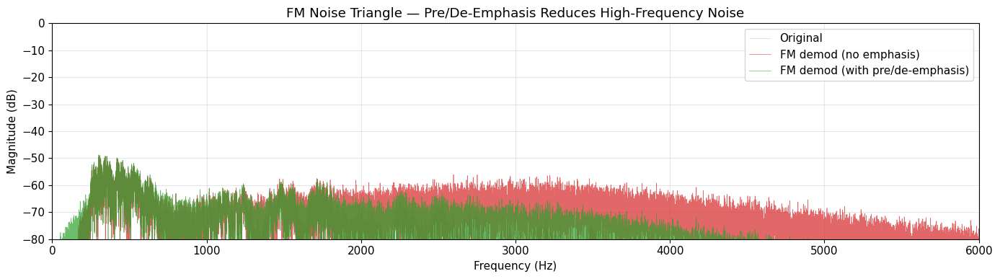

**FM at SNR=10dB — WITHOUT pre/de-emphasis:**

**FM at SNR=10dB — WITH pre/de-emphasis:**

**Original:**

In [18]:
def pre_emphasis(audio, fs, tau=750e-6):
    """Apply pre-emphasis filter (boost highs). tau=750µs for land mobile."""
    # Pre-emphasis is a first-order highpass: H(s) = 1 + s*tau
    # In discrete time: y[n] = x[n] - alpha * x[n-1]
    alpha = np.exp(-1 / (fs * tau))
    return lfilter([1, -alpha], [1], audio)

def de_emphasis(audio, fs, tau=750e-6):
    """Apply de-emphasis filter (cut highs). Inverse of pre-emphasis."""
    alpha = np.exp(-1 / (fs * tau))
    return lfilter([1], [1, -alpha], audio)

# Full chain WITH pre/de-emphasis
voice_preemph = pre_emphasis(voice_filtered, fs_work)
voice_preemph = normalize(voice_preemph)

# FM modulate the pre-emphasized audio
phase_int_pe = np.cumsum(voice_preemph) / fs_work
fm_preemph = np.cos(2 * np.pi * f_carrier * t + 2 * np.pi * freq_dev * phase_int_pe)

# Add noise
np.random.seed(42)
fm_preemph_noisy, _ = add_awgn(fm_preemph, 10)

# Demodulate
fm_pe_demod = fm_demodulate(fm_preemph_noisy, fs_work)

# Apply de-emphasis
fm_pe_demod_de = de_emphasis(fm_pe_demod, fs_work)
fm_pe_demod_de = normalize(fm_pe_demod_de)

# For comparison: FM WITHOUT pre/de-emphasis at same SNR
np.random.seed(42)
fm_no_pe_noisy, _ = add_awgn(fm_signal, 10)
fm_no_pe_demod = fm_demodulate(fm_no_pe_noisy, fs_work)

# Playback versions
fm_pe_play = normalize(resample(fm_pe_demod_de, num_samples_play))
fm_no_pe_play = normalize(resample(fm_no_pe_demod, num_samples_play))

# Show the noise triangle effect in spectra
fig, ax = plt.subplots(1, 1, figsize=(14, 4))
f1, p1 = power_spectrum(fm_no_pe_demod, fs_work)
f2, p2 = power_spectrum(fm_pe_demod_de, fs_work)
f_orig, p_orig = power_spectrum(voice_filtered, fs_work)
ax.plot(f_orig, p_orig, alpha=0.3, linewidth=0.5, label='Original', color='gray')
ax.plot(f1, p1, alpha=0.7, linewidth=0.5, label='FM demod (no emphasis)', color='tab:red')
ax.plot(f2, p2, alpha=0.7, linewidth=0.5, label='FM demod (with pre/de-emphasis)', color='tab:green')
ax.set_xlim(0, 6000)
ax.set_ylim(-80, 0)
ax.set_xlabel('Frequency (Hz)')
ax.set_ylabel('Magnitude (dB)')
ax.set_title('FM Noise Triangle — Pre/De-Emphasis Reduces High-Frequency Noise')
ax.legend()
plt.tight_layout()
plt.show()

display(Markdown('**FM at SNR=10dB — WITHOUT pre/de-emphasis:**'))
display(Audio(fm_no_pe_play, rate=fs_play))
display(Markdown('**FM at SNR=10dB — WITH pre/de-emphasis:**'))
display(Audio(fm_pe_play, rate=fs_play))
display(Markdown('**Original:**'))
display(Audio(voice_filt_play, rate=fs_play))

The version with pre/de-emphasis should sound less "hissy" — the high-frequency noise gets knocked down by the de-emphasis filter. Look at the spectrum: without emphasis, the noise floor tilts upward at higher frequencies (the noise triangle). With emphasis, it's flattened out.

This is what your Baofeng does on every transmission. The pre-emphasis is applied in the transmitter's audio chain, and the de-emphasis is applied after the FM discriminator in the receiver.

---

## 9. Side-by-Side Degradation Sweep

Let's generate a grid of audio players at multiple SNR levels so you can click through them quickly and hear the degradation curves.

In [19]:
snr_values = [30, 20, 15, 10, 5, 0]

display(Markdown('### AM vs FM Degradation Sweep'))
display(Markdown('---'))

for snr in snr_values:
    # AM
    np.random.seed(42)
    am_n, _ = add_awgn(am_signal, snr)
    am_d = am_demodulate(am_n, fs_work, f_carrier)
    am_p = normalize(resample(am_d, num_samples_play))
    
    # FM with pre/de-emphasis
    np.random.seed(42)
    fm_n, _ = add_awgn(fm_preemph, snr)
    fm_d = fm_demodulate(fm_n, fs_work)
    fm_d = de_emphasis(fm_d, fs_work)
    fm_p = normalize(resample(fm_d, num_samples_play))
    
    display(Markdown(f'**SNR = {snr} dB**'))
    display(Markdown(f'AM:'))
    display(Audio(am_p, rate=fs_play))
    display(Markdown(f'FM:'))
    display(Audio(fm_p, rate=fs_play))
    display(Markdown('---'))

### AM vs FM Degradation Sweep

---

**SNR = 30 dB**

AM:

FM:

---

**SNR = 20 dB**

AM:

FM:

---

**SNR = 15 dB**

AM:

FM:

---

**SNR = 10 dB**

AM:

FM:

---

**SNR = 5 dB**

AM:

FM:

---

**SNR = 0 dB**

AM:

FM:

---

## 10. The FM Capture Effect (Bonus)

One more thing FM does that AM can't: the **capture effect**. When two FM signals are on the same frequency, the stronger one "captures" the receiver — you hear it clearly and the weaker one disappears almost entirely. With AM, two overlapping signals mix into audible garble.

This is why you hear clean audio on a busy GMRS repeater even when someone is barely transmitting on the input frequency — the stronger signal wins.

In [ ]:
# Create a second "interfering" voice signal (use the original voice reversed)
interferer = voice_filtered[::-1].copy()  # reversed voice = different signal
interferer = normalize(interferer)

# Desired signal is 6 dB stronger than the interferer
desired_power = 1.0
interferer_power = 0.5  # -6 dB relative

# AM: both signals modulated onto the same carrier
am_desired = desired_power * (1 + m_am * voice_filtered) * carrier
am_interferer = interferer_power * (1 + m_am * interferer) * carrier
am_combined = am_desired + am_interferer
am_cap_demod = am_demodulate(am_combined, fs_work, f_carrier)
am_cap_play = normalize(resample(am_cap_demod, num_samples_play))

# FM: both signals on the same carrier
phase_int_d = np.cumsum(voice_filtered) / fs_work
fm_desired = desired_power * np.cos(2 * np.pi * f_carrier * t + 2 * np.pi * freq_dev * phase_int_d)

phase_int_i = np.cumsum(interferer) / fs_work
fm_interferer = interferer_power * np.cos(2 * np.pi * f_carrier * t + 2 * np.pi * freq_dev * phase_int_i)
fm_combined = fm_desired + fm_interferer
fm_cap_demod = fm_demodulate(fm_combined, fs_work)
fm_cap_play = normalize(resample(fm_cap_demod, num_samples_play))

display(Markdown('### Two signals on the same frequency (desired is 6 dB stronger)'))
display(Markdown('**AM — both signals audible (garbled):**'))
display(Audio(am_cap_play, rate=fs_play))
display(Markdown('**FM — capture effect (stronger signal dominates):**'))
display(Audio(fm_cap_play, rate=fs_play))
display(Markdown('**Original desired signal (reference):**'))
display(Audio(voice_filt_play, rate=fs_play))

---

## Summary

You've now heard firsthand:

1. **Band-limiting** — what the 300–3000 Hz radio audio filter does to your voice
2. **AM vs FM noise performance** — FM's resilience to both Gaussian and impulse noise
3. **Deviation tradeoff** — wider deviation = cleaner audio = more bandwidth
4. **Pre/de-emphasis** — flattening FM's noise triangle for better high-frequency clarity
5. **Capture effect** — FM's ability to lock onto the stronger of two co-channel signals

### Next steps

- Try recording yourself keying up the Baofeng and recording the receive audio on another radio — compare to the simulation
- Add CTCSS tone before modulation and see if you can hear it creep in without the high-pass filter
- Pipe real off-air IQ samples from an RTL-SDR through this same demodulation chain
- Add multipath simulation (delayed copy of the signal summed with the original) and hear the flutter